In [1]:
import calliope

In [71]:
model = calliope.Model('model.yaml')

model.run(force_rerun=True)

In [59]:
model.results

<xarray.Dataset>
Dimensions:                                 (loc_techs: 7,
                                             loc_tech_carriers_prod: 5,
                                             timesteps: 8760,
                                             loc_tech_carriers_con: 5,
                                             costs: 1, loc_techs_cost: 5,
                                             loc_techs_store: 1,
                                             ...
                                             loc_techs_investment_cost: 5,
                                             loc_carriers: 2,
                                             loc_carriers_system_balance_constraint: 2,
                                             loc_techs_balance_demand_constraint: 2,
                                             loc_techs_cost_investment_constraint: 5,
                                             carriers: 1, techs: 7)
Coordinates: (12/15)
  * techs                                   (techs) object 'ac_transmission' ...
  * costs                                   (costs) <U8 'monetary'
  * loc_carriers                            (loc_carriers) <U14 'region1::pow...
  * loc_carriers_system_balance_constraint  (loc_carriers_system_balance_constraint) <U14 ...
  * loc_tech_carriers_con                   (loc_tech_carriers_con) <U39 'reg...
  * loc_tech_carriers_prod                  (loc_tech_carriers_prod) <U39 're...
    ...                                      ...
  * loc_techs_cost_investment_constraint    (loc_techs_cost_investment_constraint) <U32 ...
  * loc_techs_investment_cost               (loc_techs_investment_cost) <U32 ...
  * loc_techs_om_cost                       (loc_techs_om_cost) <U19 'region2...
  * loc_techs_store                         (loc_techs_store) <U16 'region1::...
  * timesteps                               (timesteps) datetime64[ns] 2023-0...
  * carriers                                (carriers) <U5 'power'
Data variables: (12/17)
    energy_cap                              (loc_techs) float64 1e+04 ... 6e+04
    carrier_prod                            (loc_tech_carriers_prod, timesteps) float64 ...
    carrier_con                             (loc_tech_carriers_con, timesteps) float64 ...
    cost                                    (costs, loc_techs_cost) float64 5...
    storage_cap                             (loc_techs_store) float64 2.5e+03
    storage                                 (loc_techs_store, timesteps) float64 ...
    ...                                      ...
    cost_investment_rhs                     (costs, loc_techs_cost_investment_constraint) float64 ...
    cost_var_rhs                            (costs, loc_techs_om_cost, timesteps) float64 ...
    capacity_factor                         (timesteps, loc_tech_carriers_prod) float64 ...
    systemwide_capacity_factor              (carriers, techs) float64 nan ......
    systemwide_levelised_cost               (carriers, costs, techs) float64 ...
    total_levelised_cost                    (carriers, costs) float64 115.7
Attributes:
    termination_condition:     optimal
    objective_function_value:  23028405847.720196
    solution_time:             8.058375
    time_finished:             2024-12-06 13:19:59
    calliope_version:          0.6.10
    applied_overrides:         
    scenario:                  None
    defaults:                  carrier_ratios:\ncharge_rate:\nenergy_cap_per_...
    allow_operate_mode:        1
    model_config:              calliope_version: 0.6.10\nname: Simple Storage...
    run_config:                backend: pyomo\nbigM: 1000000.0\ncyclic_storag...

In [60]:
model.plot.timeseries()

/Users/graeme/miniconda3/envs/calliope_6_10/lib/python3.9/site-packages/calliope/postprocess/plotting/plotting.py:105: FutureWarning:

Plotting will no longer be available as a method of the Calliope model object infuture versions of Calliope. In the meantime, as of v0.6.6, plotting is untested; this functionality should now be used with caution. We expect to reintroduce it as a seperate module in v0.7.0.



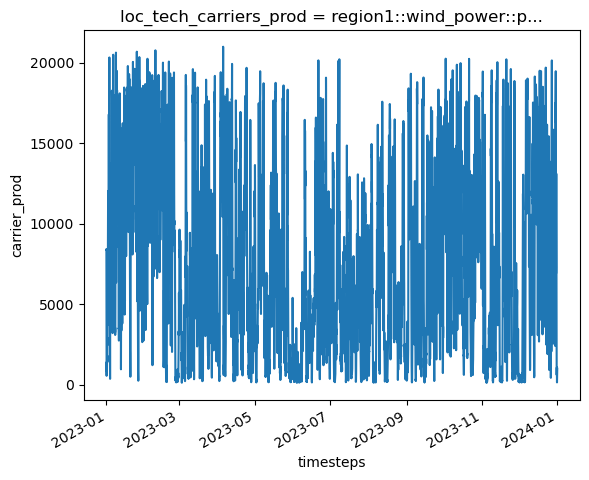

In [64]:
# show timeseries of wind power production for region 1
model.results.carrier_prod.sel(loc_tech_carriers_prod='region1::wind_power::power').plot()

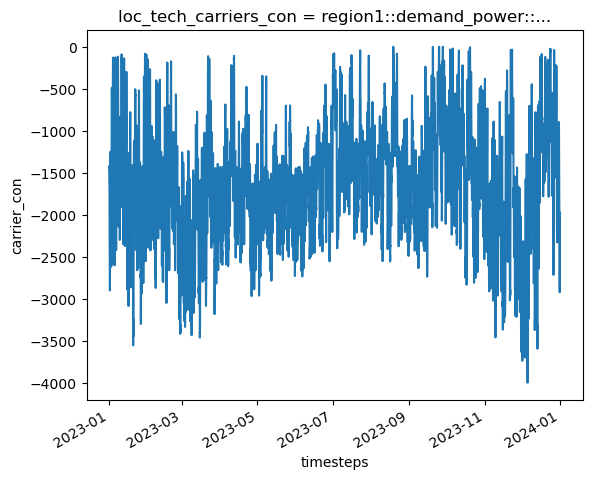

In [65]:
# show timeseries of power demand for region 1
model.results.carrier_con.sel(loc_tech_carriers_con='region1::demand_power::power').plot()

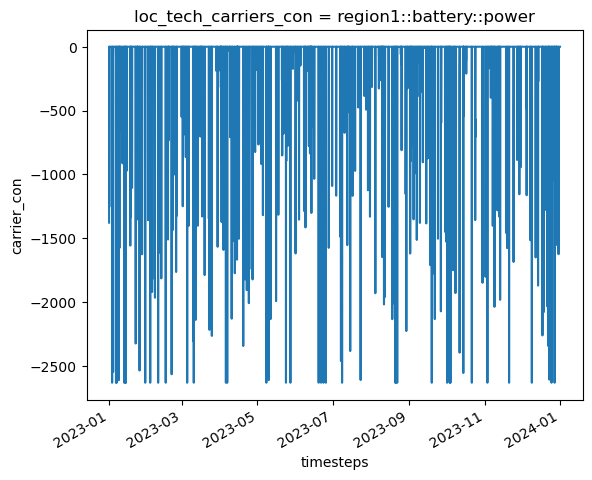

In [66]:
# show timeseries of battery import for region 1
model.results.carrier_con.sel(loc_tech_carriers_con='region1::battery::power').plot()

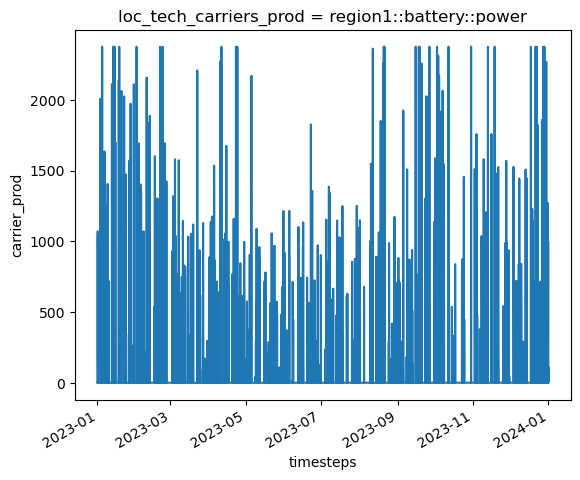

In [67]:
# show timeseries of battery export for region 1
model.results.carrier_prod.sel(loc_tech_carriers_prod='region1::battery::power').plot()

In [69]:
# get regional costs per technology
model.get_formatted_array('cost').loc[{'costs': 'monetary'}].to_pandas()

techs,ac_transmission:region1,ac_transmission:region2,battery,ccgt,wind_power
locs,,,,,
region1,NaN,176268.915504,5.508404e+07,NaN,1.044393e+10
region2,176268.915504,NaN,NaN,1.252904e+10,NaN


In [70]:
# get levelised costs for each technology
model.plot.capacity(array='systemwide_levelised_cost')

/Users/graeme/miniconda3/envs/calliope_6_10/lib/python3.9/site-packages/calliope/postprocess/plotting/plotting.py:105: FutureWarning:

Plotting will no longer be available as a method of the Calliope model object infuture versions of Calliope. In the meantime, as of v0.6.6, plotting is untested; this functionality should now be used with caution. We expect to reintroduce it as a seperate module in v0.7.0.

